In [1]:
import torch
torch.cuda.memory_cached()
import os
import torch
import torch.nn as nn
import numpy as np
import torch.optim as optim
import pandas as pd
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from PIL import Image
from sklearn.model_selection import train_test_split
import optuna
import sys
import matplotlib.pyplot as plt
import numpy as np
import cv2
from torchvision.transforms.functional import to_tensor, to_pil_image
import best_modelo_general as bmg
import best_modelo_general_colon as bmgc
import best_modelo_general_lung as bmgl
import best_modelo_general_gastrointestinal as bmgg
import best_modelo_general_oral as bmgo
sys.path.append("C:/Users/Matias/Desktop/Tesis/Tesis-Codes/utils")
import creacion_df_torch as qol

dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"

# Preparar datos
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='all')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=80, m_type='bin')

#Preparamos
import os
import pandas as pd

# Ruta al directorio del dataset
dataset_dir = r"C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias"


# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")


c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\cuda\memory.py:444: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  warnings.warn(
c:\Users\Matias\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\SCC\lung_SCC_lungscc785.jpeg


In [2]:
dataframe = qol.crear_dataframe_binario(dataset_dir)

# Mostrar primeras filas del DataFrame
print(dataframe.head())

# Mostrar distribución de clases
print(dataframe['etiqueta'].value_counts())
print(dataframe['tipo_cancer'].value_counts())

                                                ruta etiqueta tipo_cancer
0  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
1  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
2  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
3  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
4  C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasi...  maligno       colon
maligno    29274
benigno    17190
Name: etiqueta, dtype: int64
lung                15000
oral                13464
colon               10000
gastrointestinal     8000
Name: tipo_cancer, dtype: int64


# Modelos ya entrenados previamente 


In [2]:
'''model_bmg= bmg.Net()
model_bmg.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt', map_location="cuda:0"))


model_bmgc= bmg.Net()
model_bmgc.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt', map_location="cuda:0"))

model_bmgl= bmg.Net()
model_bmgl.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt', map_location="cuda:0"))

model_bmgo= bmg.Net()
model_bmgo.load_state_dict(torch.load('C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt', map_location="cuda:0"))

'''





'model_bmg= bmg.Net()\nmodel_bmg.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt\', map_location="cuda:0"))\n\n\nmodel_bmgc= bmg.Net()\nmodel_bmgc.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt\', map_location="cuda:0"))\n\nmodel_bmgl= bmg.Net()\nmodel_bmgl.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt\', map_location="cuda:0"))\n\nmodel_bmgo= bmg.Net()\nmodel_bmgo.load_state_dict(torch.load(\'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt\', map_location="cuda:0"))\n\n'

# Modelos Binarios Cancer-No Cancer

## Modelo General 4 tipos de Cancer

In [3]:


# Entrenar modelo
model_bmg = bmg.train_model(device, train_loader, val_loader)
#Cargamos el modelo si ya lo tenemos entrenado
# Guardar el estado del diccionario de cada modelo
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pth')
torch.save(model_bmg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmg.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmg, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


try:
    # Ejemplo de uso
    val_metrics, test_metrics = qol.evaluate_model_with_metrics(device, model_bmg, val_loader, test_loader)
    print(f'Final Validation Metrics: Accuracy={val_metrics[0]:.4f}, Recall={val_metrics[1]:.4f}, Precision={val_metrics[2]:.4f}, F1={val_metrics[3]:.4f}')
    print(f'Final Test Metrics: Accuracy={test_metrics[0]:.4f}, Recall={test_metrics[1]:.4f}, Precision={test_metrics[2]:.4f}, F1={test_metrics[3]:.4f}')
except:
    print('error')

Validation Accuracy: 0.9183
Test Accuracy: 0.9183
Final Test Accuracy: 0.9183


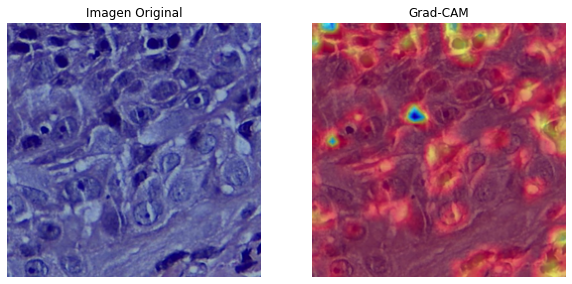

In [4]:


# Cargar y preparar la imagen
imagen = Image.open(ruta_imagen_prueba).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
imagen_tensor = transform(imagen).to(device)

# Crear una instancia de GradCAM
target_layer = model_bmg.features[-1]  # Última capa convolucional
grad_cam = qol.GradCAM(model_bmg, target_layer)

# Generar el mapa de calor
mask = grad_cam.generate(imagen_tensor)

# Mostrar la imagen con el mapa de calor
imagen_np = np.array(imagen.resize((256, 256))) / 255.0
cam_image = qol.show_cam_on_image(imagen_np, mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(imagen_np)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title('Grad-CAM')
plt.axis('off')

plt.show()

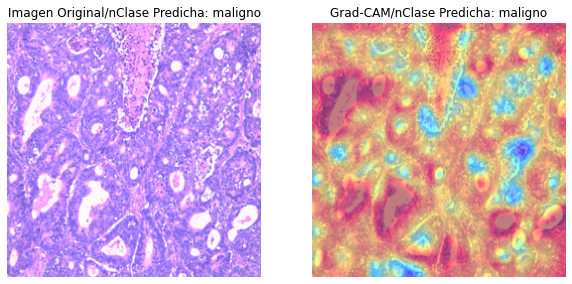

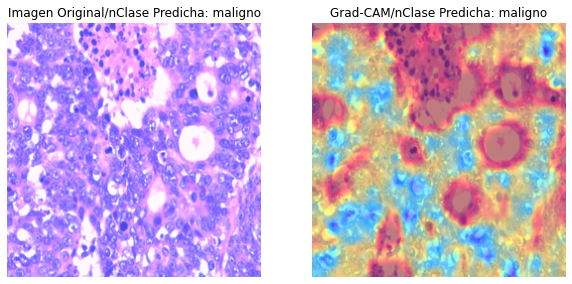

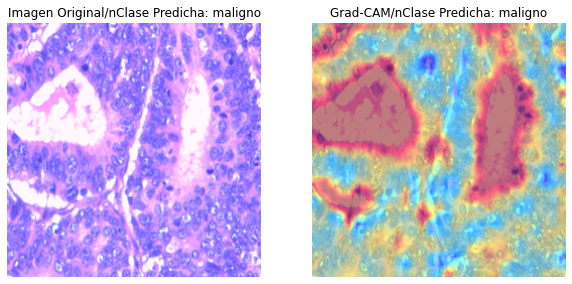

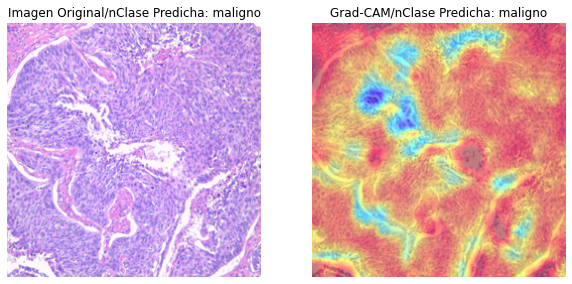

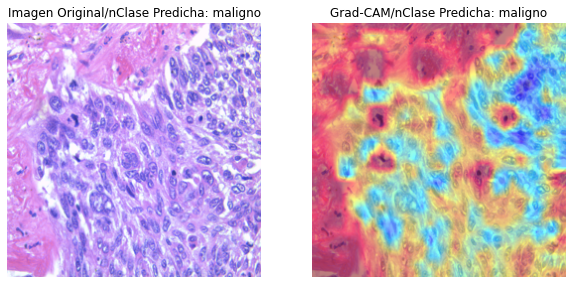

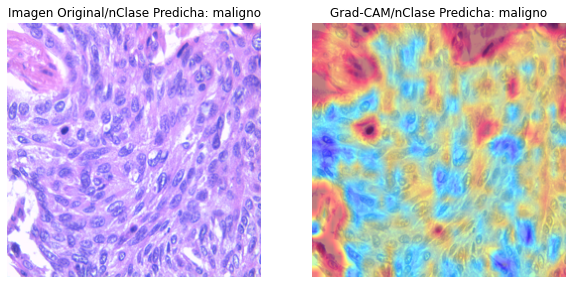

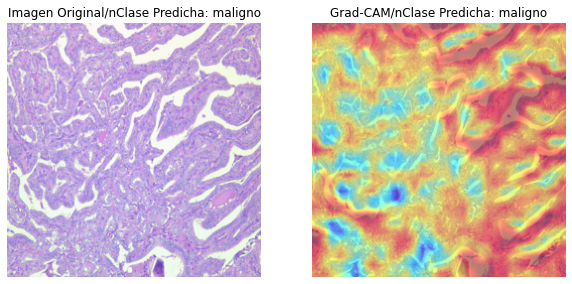

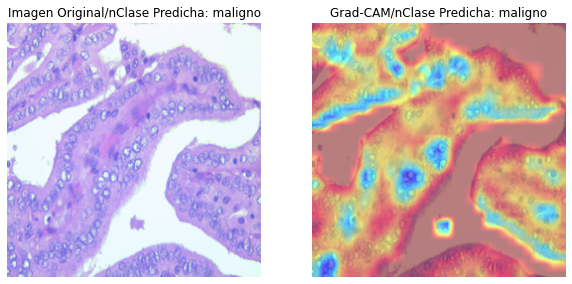

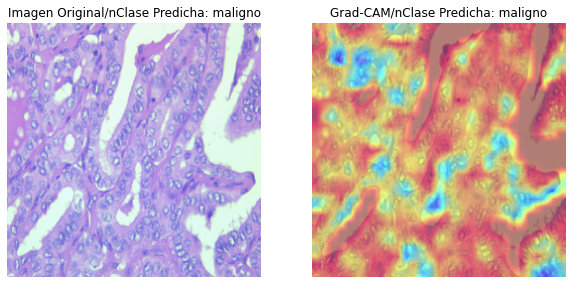

In [5]:
# Lista de rutas de imágenes externas
image_paths = ['C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 10X.tif', 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X B.tif", 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X.tif"]  


# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmg.eval()
    with torch.no_grad():
        output = model_bmg(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmg.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmg, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.show()

## Modelo Binario Colon

In [6]:
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='colon')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])

# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=80, m_type='bin')
# Entrenar modelo
model_bmgc= bmgc.train_model(device, train_loader, val_loader)
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pth')
torch.save(model_bmgc, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgc.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgc, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')


Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\colon_ACA_colonca1450.jpeg
Validation Accuracy: 0.9547
Test Accuracy: 0.9394
Final Test Accuracy: 0.9394


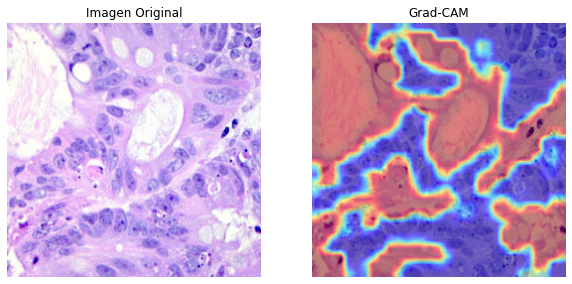

In [7]:
# Cargar y preparar la imagen
imagen = Image.open(ruta_imagen_prueba).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
imagen_tensor = transform(imagen).to(device)

# Crear una instancia de GradCAM
target_layer = model_bmgc.features[-1]  # Última capa convolucional
grad_cam = qol.GradCAM(model_bmgc, target_layer)

# Generar el mapa de calor
mask = grad_cam.generate(imagen_tensor)

# Mostrar la imagen con el mapa de calor
imagen_np = np.array(imagen.resize((256, 256))) / 255.0
cam_image = qol.show_cam_on_image(imagen_np, mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(imagen_np)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title('Grad-CAM')
plt.axis('off')

plt.show()

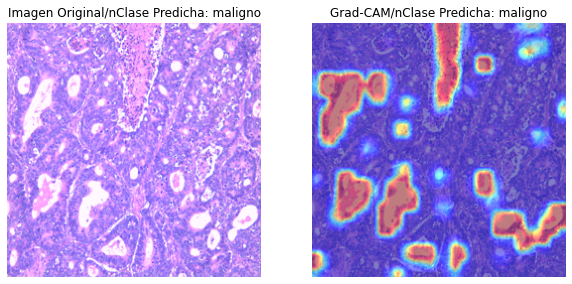

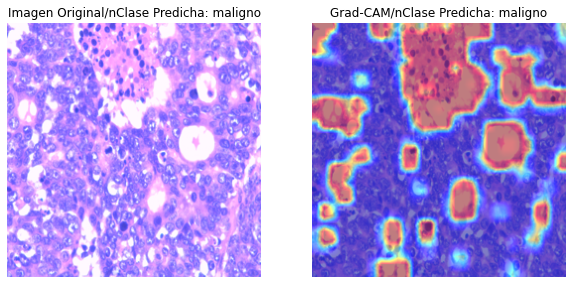

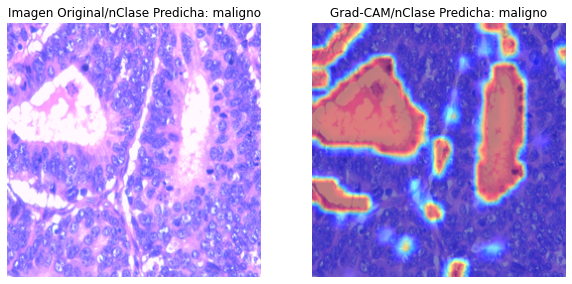

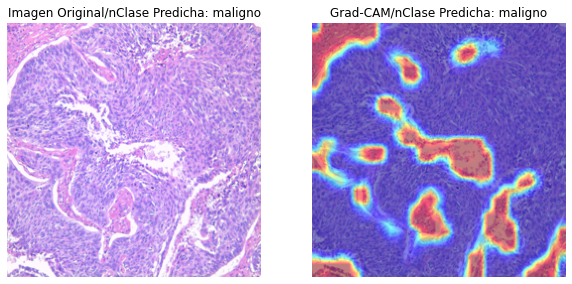

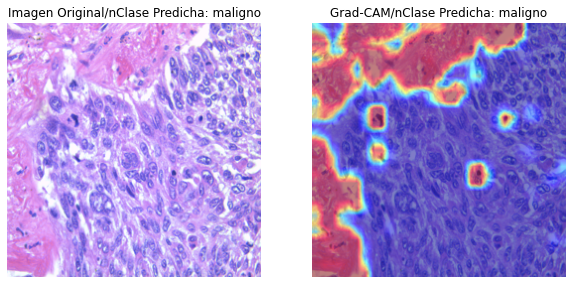

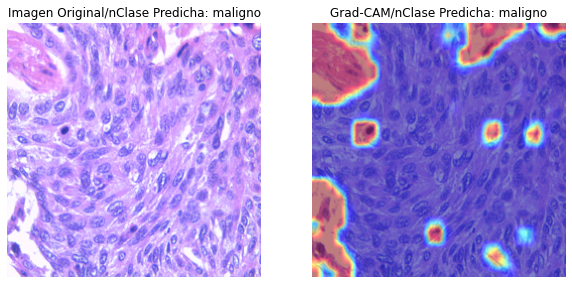

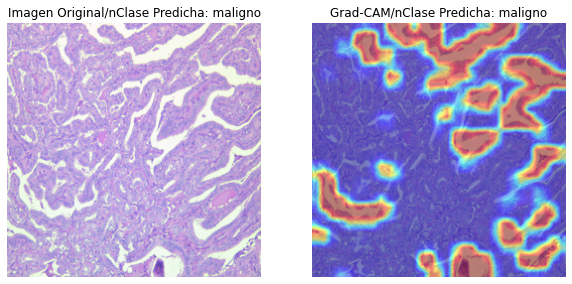

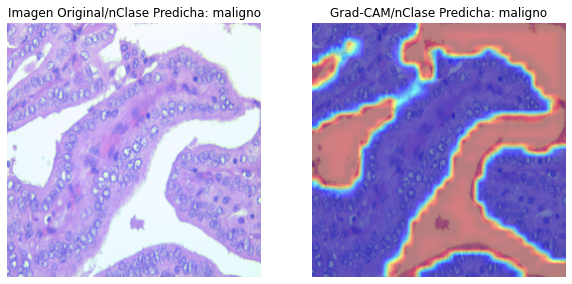

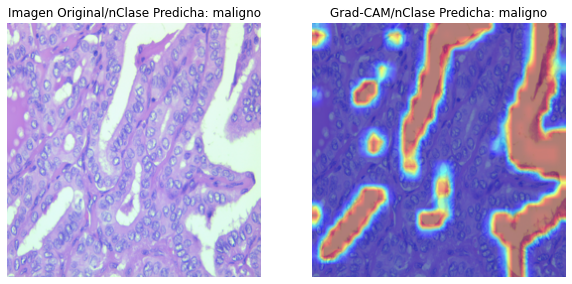

In [8]:
# Lista de rutas de imágenes externas
image_paths = ['C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 10X.tif', 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X B.tif", 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X.tif"]  


# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmgc.eval()
    with torch.no_grad():
        output = model_bmgc(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmgc.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmgc, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.show()

## Modelo Binario Pulmon

In [9]:
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='lung')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
# Entrenar modelo
model_bmgl= bmgl.train_model(device, train_loader, val_loader)
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pth')
torch.save(model_bmgl, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgl.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgl, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\benigno\lung_benigno_lungn2459.jpeg
Validation Accuracy: 0.9950
Test Accuracy: 0.9953
Final Test Accuracy: 0.9953


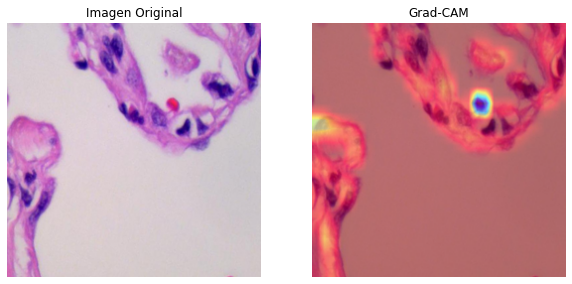

In [10]:
# Cargar y preparar la imagen
imagen = Image.open(ruta_imagen_prueba).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
imagen_tensor = transform(imagen).to(device)

# Crear una instancia de GradCAM
target_layer = model_bmgl.features[-1]  # Última capa convolucional
grad_cam = qol.GradCAM(model_bmgl, target_layer)

# Generar el mapa de calor
mask = grad_cam.generate(imagen_tensor)

# Mostrar la imagen con el mapa de calor
imagen_np = np.array(imagen.resize((256, 256))) / 255.0
cam_image = qol.show_cam_on_image(imagen_np, mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(imagen_np)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title('Grad-CAM')
plt.axis('off')

plt.show()

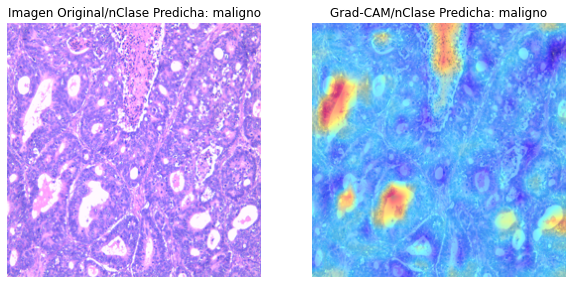

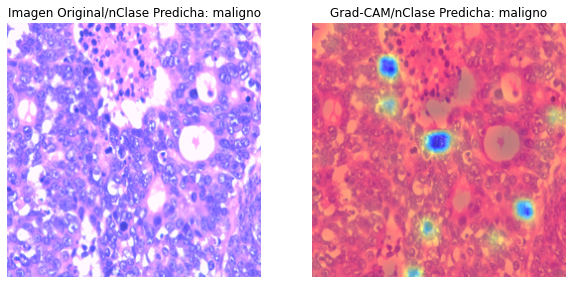

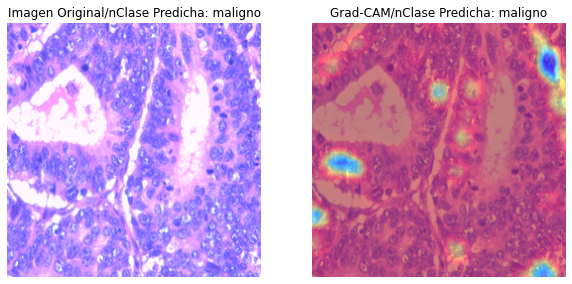

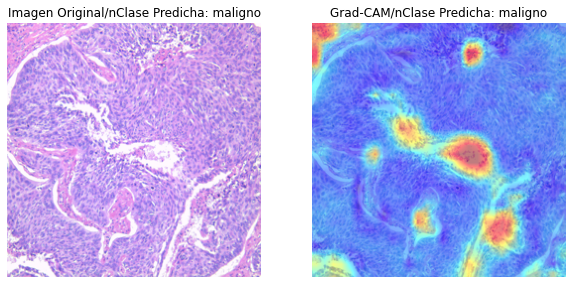

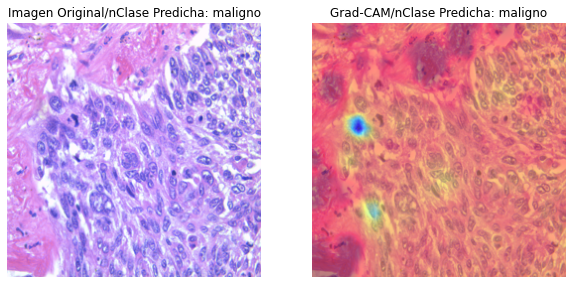

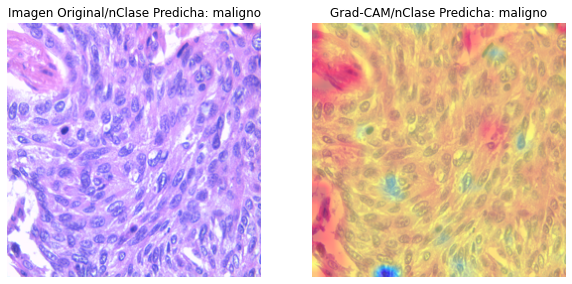

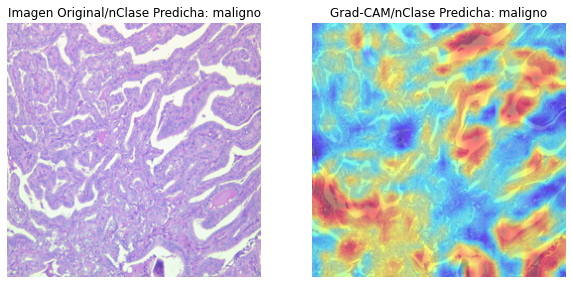

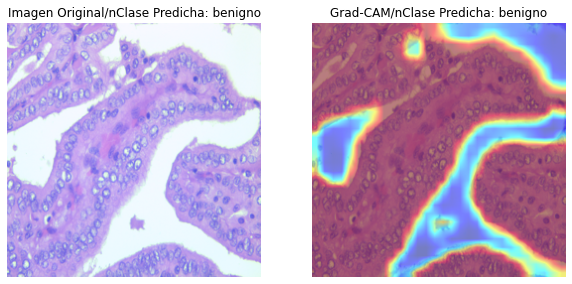

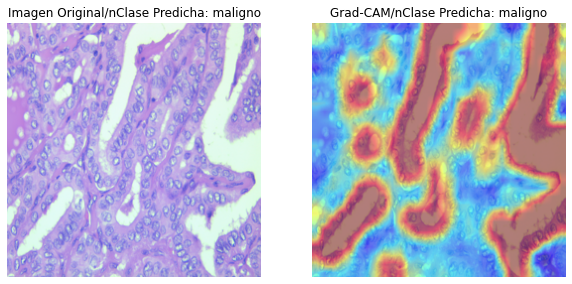

In [11]:
# Lista de rutas de imágenes externas
image_paths = ['C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 10X.tif', 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X B.tif", 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X.tif"]  

# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmgl.eval()
    with torch.no_grad():
        output = model_bmgl(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmgl.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmgl, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.show()

## Modelo Binario Gastrointestinal

In [12]:
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='gastrointestinal')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=40, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
# Entrenar modelo
model_bmgg= bmgg.train_model(device, train_loader, val_loader)
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pth')
torch.save(model_bmgg, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgg.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgg, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\ACA\gastrointestinal_ACA_TUM-EMLCMVCGGDIF.png
Validation Accuracy: 0.9695
Test Accuracy: 0.9659
Final Test Accuracy: 0.9659


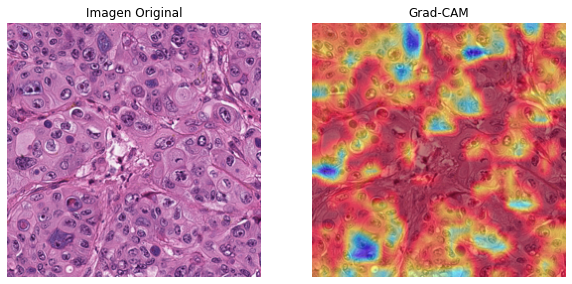

In [13]:
# Cargar y preparar la imagen
imagen = Image.open(ruta_imagen_prueba).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
imagen_tensor = transform(imagen).to(device)

# Crear una instancia de GradCAM
target_layer = model_bmgg.features[-1]  # Última capa convolucional
grad_cam = qol.GradCAM(model_bmgg, target_layer)

# Generar el mapa de calor
mask = grad_cam.generate(imagen_tensor)

# Mostrar la imagen con el mapa de calor
imagen_np = np.array(imagen.resize((256, 256))) / 255.0
cam_image = qol.show_cam_on_image(imagen_np, mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(imagen_np)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title('Grad-CAM')
plt.axis('off')

plt.show()

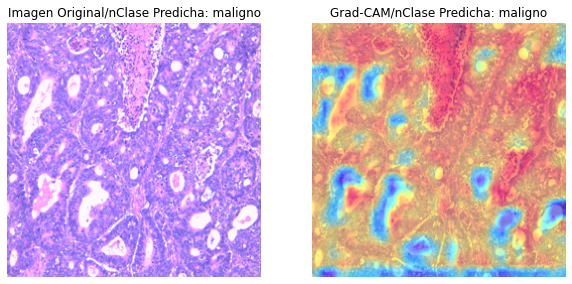

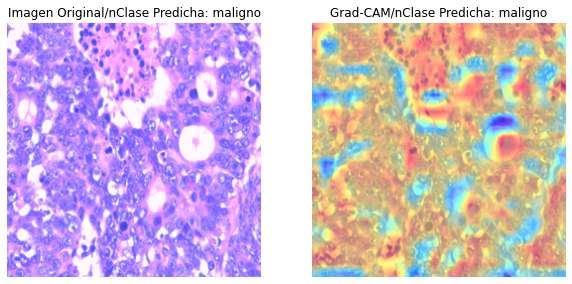

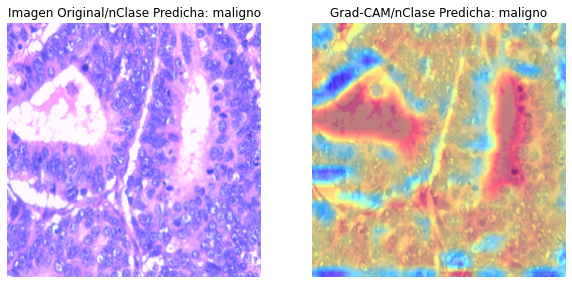

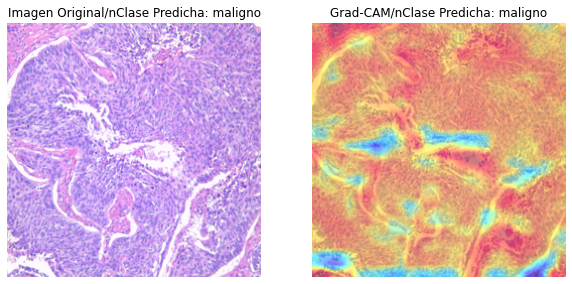

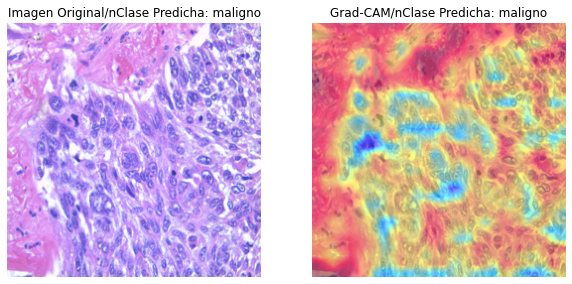

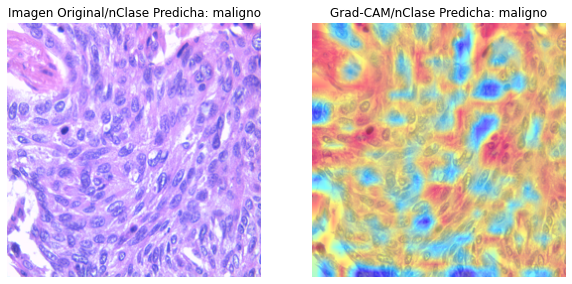

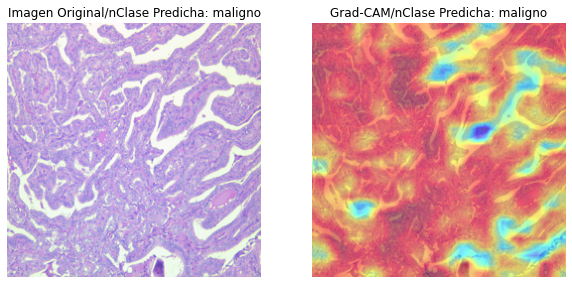

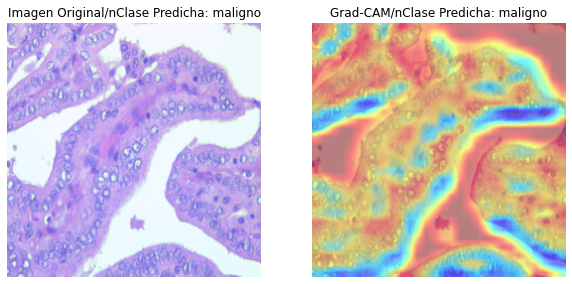

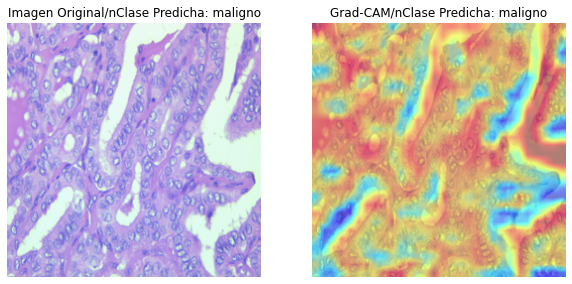

In [14]:
# Lista de rutas de imágenes externas
image_paths = ['C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 10X.tif', 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X B.tif", 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X.tif"]  

# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmgg.eval()
    with torch.no_grad():
        output = model_bmgg(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmgg.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmgg, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.show()

## Modelo Binario Oral

In [15]:
df = qol.crear_dataframe_binario(dataset_dir, filtro_cancer='oral')
train_loader, val_loader, test_loader = qol.prepare_data_loaders(df, batch_size=20, m_type='bin')
# Preparar los DataLoaders (usando el DataFrame binario como ejemplo)
# Guardar el DataFrame de prueba
_, test_val_df = train_test_split(df, test_size=0.3, random_state=46, stratify=df['etiqueta'])
_, test_df = train_test_split(test_val_df, test_size=0.33, random_state=46, stratify=test_val_df['etiqueta'])



# Seleccionar una imagen del conjunto de prueba
imagen_prueba = test_df.sample(n=1).iloc[0]
ruta_imagen_prueba = imagen_prueba['ruta']

print(f"Imagen seleccionada: {ruta_imagen_prueba}")
# Entrenar modelo
model_bmgo= bmgo.train_model(device, train_loader, val_loader)
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pth')
torch.save(model_bmgo, 'C:/Users/Matias/Desktop/Tesis/Tesis-Codes/Best_Optuna_Models/model_bmgo.pt')

# Evaluar modelo
test_accuracy = qol.evaluate_model(device, model_bmgo, test_loader)
print(f'Final Test Accuracy: {test_accuracy:.4f}')

Imagen seleccionada: C:/Users/Matias/Desktop/Tesis/Dataset_Neoplasias\SCC\oral_SCC_OSCC_400x_267_1_c4a95c6f-ea89-481f-8a4e-74fdaf846926_1.JPEG
Validation Accuracy: 0.8134
Test Accuracy: 0.8043
Final Test Accuracy: 0.8043


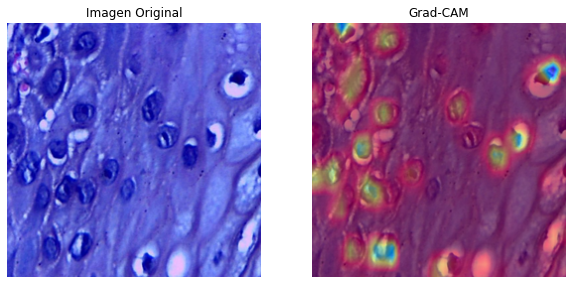

In [16]:
# Cargar y preparar la imagen
imagen = Image.open(ruta_imagen_prueba).convert('RGB')
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
imagen_tensor = transform(imagen).to(device)

# Crear una instancia de GradCAM
target_layer = model_bmgo.features[-1]  # Última capa convolucional
grad_cam = qol.GradCAM(model_bmgo, target_layer)

# Generar el mapa de calor
mask = grad_cam.generate(imagen_tensor)

# Mostrar la imagen con el mapa de calor
imagen_np = np.array(imagen.resize((256, 256))) / 255.0
cam_image = qol.show_cam_on_image(imagen_np, mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(imagen_np)
plt.title('Imagen Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cam_image)
plt.title('Grad-CAM')
plt.axis('off')

plt.show()

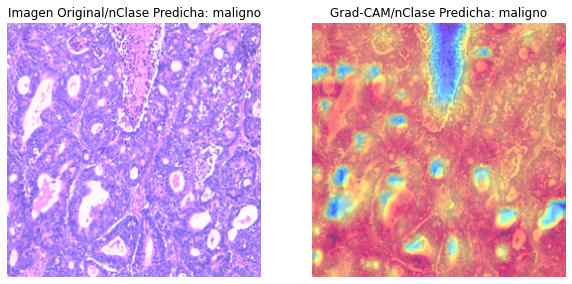

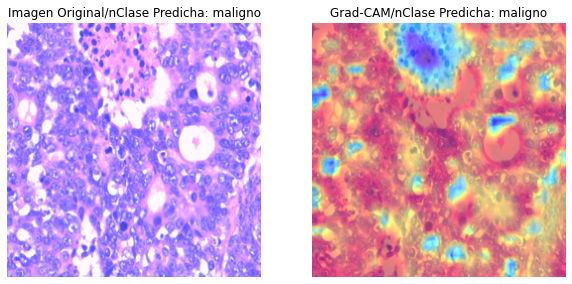

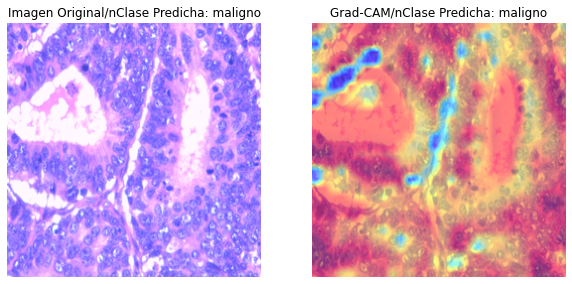

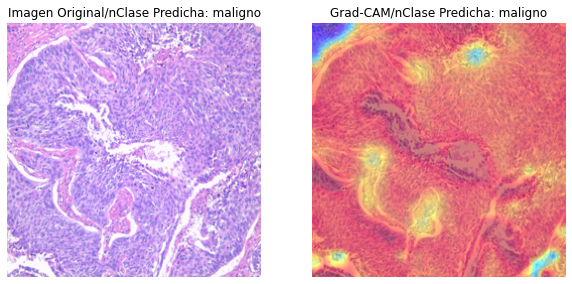

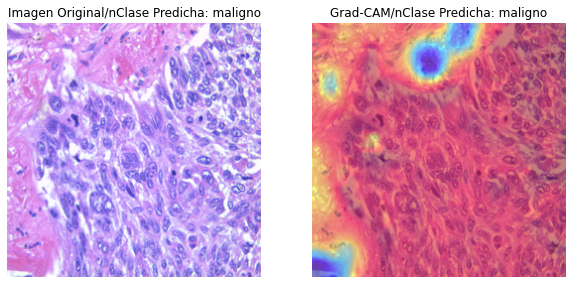

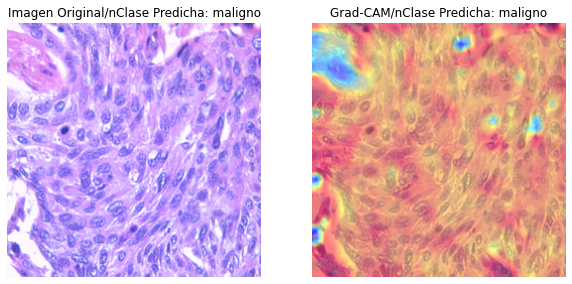

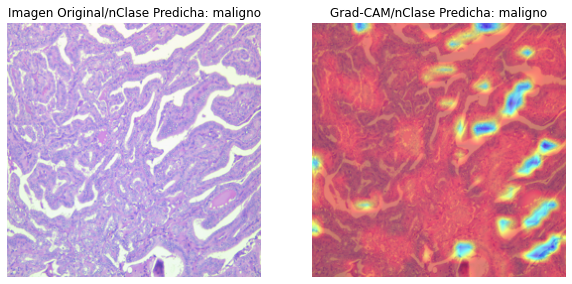

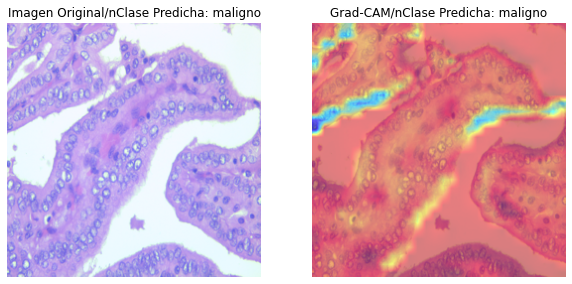

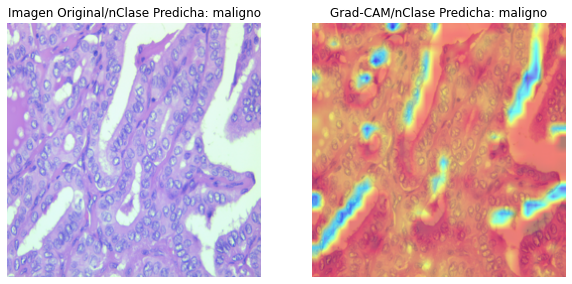

In [17]:
# Lista de rutas de imágenes externas
image_paths = ['C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 10X.tif', 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X B.tif", 
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Adenoca colon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca escamoso pulmon HE 40X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 10X.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X B.tif",
               "C:/Users/Matias/Desktop/Tesis/dataset_original_dra_gonzalez/Ca papilar tiroides HE 40X.tif"]  

# Iterar sobre cada imagen en la lista
for image_path in image_paths:
    # Cargar y preparar la imagen
    imagen = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    imagen_tensor = transform(imagen).unsqueeze(0).to(device)  # Añadir batch dimension (1, 3, 256, 256)

    # Obtener la predicción del modelo
    model_bmgo.eval()
    with torch.no_grad():
        output = model_bmgo(imagen_tensor)
    _, class_idx = torch.max(output, 1)
    class_idx = class_idx.item()  # Convertir a entero

    # Crear una instancia de GradCAM
    target_layer = model_bmgo.features[-1]  # Última capa convolucional
    grad_cam = qol.GradCAM(model_bmgo, target_layer)

    # Generar el mapa de calor
    mask = grad_cam.generate(imagen_tensor.squeeze(0), class_idx=class_idx)  # Remover la dimensión batch para GradCAM

    # Mostrar la imagen con el mapa de calor
    imagen_np = np.array(imagen.resize((256, 256))) / 255.0
    cam_image = qol.show_cam_on_image(imagen_np, mask)

    # Definir etiquetas de clase si están disponibles
    class_labels = ['benigno', 'maligno']  # Ajusta esto según tu problema

    # Obtener el nombre de la clase predicha
    predicted_class = class_labels[class_idx] if class_labels else str(class_idx)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(imagen_np)
    plt.title(f'Imagen Original/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(f'Grad-CAM/nClase Predicha: {predicted_class}')
    plt.axis('off')

    plt.show()